# Statistical Methods Project

- The project plays a crucial role throughout the data analysis process, from understanding the characteristics of the dataset through statistical analysis, to building and evaluating predictive models, to identifying and addressing any data quality issues.
- The purpose of the project at each stage is to support the overall objectives of the data analysis project and to ensure that the conclusions and decisions made are based on sound and reliable information.

## Import Library

In [116]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
import matplotlib.pyplot as plt
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from scipy.stats import t
from scipy.stats import ttest_1samp

## Load Dataset

In [117]:
df = pd.read_csv("/content/dairy_dataset.csv")
df.head()

,Location,Total Land Area (acres),Number of Cows,Farm Size,Date,Product ID,Product Name,Brand,Quantity (liters/kg),Price per Unit,...,Production Date,Expiration Date,Quantity Sold (liters/kg),Price per Unit (sold),Approx. Total Revenue(INR),Customer Location,Sales Channel,Quantity in Stock (liters/kg),Minimum Stock Threshold (liters/kg),Reorder Quantity (liters/kg)
0,Telangana,310.84,96,Medium,2022-02-17,5,Ice Cream,Dodla Dairy,222.40,85.72,...,2021-12-27,2022-01-21,7,82.24,575.68,Madhya Pradesh,Wholesale,215,19.55,64.03
1,Uttar Pradesh,19.19,44,Large,2021-12-01,1,Milk,Amul,687.48,42.61,...,2021-10-03,2021-10-25,558,39.24,21895.92,Kerala,Wholesale,129,43.17,181.10
2,Tamil Nadu,581.69,24,Medium,2022-02-28,4,Yogurt,Dodla Dairy,503.48,36.50,...,2022-01-14,2022-02-13,256,33.81,8655.36,Madhya Pradesh,Online,247,15.10,140.83
3,Telangana,908.00,89,Small,2019-06-09,3,Cheese,Britannia Industries,823.36,26.52,...,2019-05-15,2019-07-26,601,28.92,17380.92,Rajasthan,Online,222,74.50,57.68
4,Maharashtra,861.95,21,Medium,2020-12-14,8,Buttermilk,Mother Dairy,147.77,83.85,...,2020-10-17,2020-10-28,145,83.07,12045.15,Jharkhand,Retail,2,76.02,33.40


## Check Data Informations

In [118]:
df.shape

(4325, 23)

In [119]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4325 entries, 0 to 4324
Data columns (total 23 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Location                             4325 non-null   object 
 1   Total Land Area (acres)              4325 non-null   float64
 2   Number of Cows                       4325 non-null   int64  
 3   Farm Size                            4325 non-null   object 
 4   Date                                 4325 non-null   object 
 5   Product ID                           4325 non-null   int64  
 6   Product Name                         4325 non-null   object 
 7   Brand                                4325 non-null   object 
 8   Quantity (liters/kg)                 4325 non-null   float64
 9   Price per Unit                       4325 non-null   float64
 10  Total Value                          4325 non-null   float64
 11  Shelf Life (days)             

In [120]:
df.columns

Index(['Location', 'Total Land Area (acres)', 'Number of Cows', 'Farm Size',
       'Date', 'Product ID', 'Product Name', 'Brand', 'Quantity (liters/kg)',
       'Price per Unit', 'Total Value', 'Shelf Life (days)',
       'Storage Condition', 'Production Date', 'Expiration Date',
       'Quantity Sold (liters/kg)', 'Price per Unit (sold)',
       'Approx. Total Revenue(INR)', 'Customer Location', 'Sales Channel',
       'Quantity in Stock (liters/kg)', 'Minimum Stock Threshold (liters/kg)',
       'Reorder Quantity (liters/kg)'],
      dtype='object')

In [121]:
df.isnull().sum()

Location                               0
Total Land Area (acres)                0
Number of Cows                         0
Farm Size                              0
Date                                   0
Product ID                             0
Product Name                           0
Brand                                  0
Quantity (liters/kg)                   0
Price per Unit                         0
Total Value                            0
Shelf Life (days)                      0
Storage Condition                      0
Production Date                        0
Expiration Date                        0
Quantity Sold (liters/kg)              0
Price per Unit (sold)                  0
Approx. Total Revenue(INR)             0
Customer Location                      0
Sales Channel                          0
Quantity in Stock (liters/kg)          0
Minimum Stock Threshold (liters/kg)    0
Reorder Quantity (liters/kg)           0
dtype: int64

In [122]:
df.duplicated().sum()

0

In [123]:
df.describe()

,Total Land Area (acres),Number of Cows,Product ID,Quantity (liters/kg),Price per Unit,Total Value,Shelf Life (days),Quantity Sold (liters/kg),Price per Unit (sold),Approx. Total Revenue(INR),Quantity in Stock (liters/kg),Minimum Stock Threshold (liters/kg),Reorder Quantity (liters/kg)
count,4325.000000,4325.000000,4325.000000,4325.000000,4325.000000,4325.000000,4325.000000,4325.000000,4325.00000,4325.000000,4325.000000,4325.000000,4325.000000
mean,503.483073,54.963699,5.509595,500.652657,54.785938,27357.845411,29.127630,248.095029,54.77914,13580.265401,252.068671,55.826143,109.107820
std,285.935061,26.111487,2.842979,288.975915,26.002815,21621.051594,30.272114,217.024182,26.19279,14617.009122,223.620870,26.301450,51.501035
min,10.170000,10.000000,1.000000,1.170000,10.030000,42.516500,1.000000,1.000000,5.21000,12.540000,0.000000,10.020000,20.020000
25%,252.950000,32.000000,3.000000,254.170000,32.460000,9946.814500,10.000000,69.000000,32.64000,2916.650000,66.000000,32.910000,64.280000
50%,509.170000,55.000000,6.000000,497.550000,54.400000,21869.652900,22.000000,189.000000,54.14000,8394.540000,191.000000,56.460000,108.340000
75%,751.250000,77.000000,8.000000,749.780000,77.460000,40954.441000,30.000000,374.000000,77.46000,19504.550000,387.000000,79.010000,153.390000
max,999.530000,100.000000,10.000000,999.930000,99.990000,99036.369600,150.000000,960.000000,104.51000,89108.900000,976.000000,99.990000,199.950000


In [124]:
# List of categorical columns
categorical_columns = [
    'Location', 'Farm Size', 'Product Name', 'Brand', 'Storage Condition',
    'Customer Location', 'Sales Channel'
]

# Print unique values for each categorical column
for column in categorical_columns:
    unique_values = df[column].unique()
    print(f"Unique values in '{column}': {unique_values}\n")

Unique values in 'Location': ['Telangana' 'Uttar Pradesh' 'Tamil Nadu' 'Maharashtra' 'Karnataka'
 'Bihar' 'West Bengal' 'Madhya Pradesh' 'Chandigarh' 'Delhi' 'Gujarat'
 'Kerala' 'Jharkhand' 'Rajasthan' 'Haryana']

Unique values in 'Farm Size': ['Medium' 'Large' 'Small']

Unique values in 'Product Name': ['Ice Cream' 'Milk' 'Yogurt' 'Cheese' 'Buttermilk' 'Curd' 'Paneer' 'Lassi'
 'Ghee' 'Butter']

Unique values in 'Brand': ['Dodla Dairy' 'Amul' 'Britannia Industries' 'Mother Dairy' 'Raj'
 'Dynamix Dairies' 'Sudha' 'Passion Cheese' 'Warana' 'Palle2patnam'
 'Parag Milk Foods']

Unique values in 'Storage Condition': ['Frozen' 'Tetra Pack' 'Refrigerated' 'Polythene Packet' 'Ambient']

Unique values in 'Customer Location': ['Madhya Pradesh' 'Kerala' 'Rajasthan' 'Jharkhand' 'Gujarat' 'Karnataka'
 'Haryana' 'Tamil Nadu' 'West Bengal' 'Telangana' 'Chandigarh'
 'Maharashtra' 'Delhi' 'Bihar' 'Uttar Pradesh']

Unique values in 'Sales Channel': ['Wholesale' 'Online' 'Retail']



### Generates a histogram for each numerical column in the dataset to show the frequency of each values

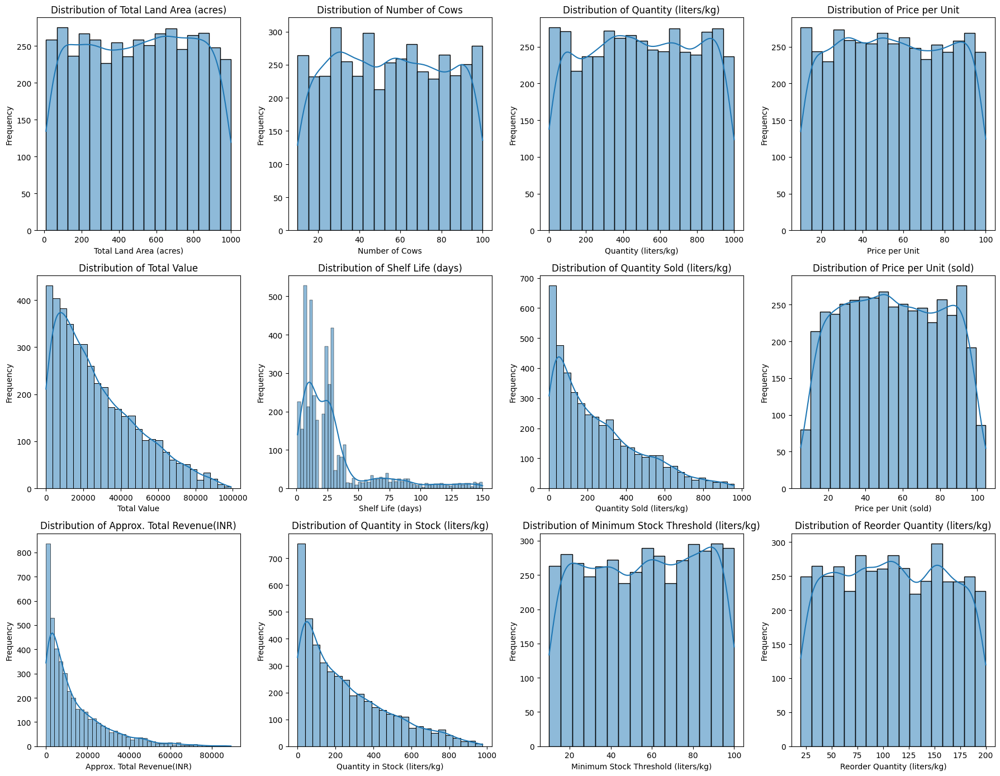

In [125]:
# List of numerical columns
numerical_columns = [
    'Total Land Area (acres)', 'Number of Cows', 'Quantity (liters/kg)',
    'Price per Unit', 'Total Value', 'Shelf Life (days)',
    'Quantity Sold (liters/kg)', 'Price per Unit (sold)',
    'Approx. Total Revenue(INR)', 'Quantity in Stock (liters/kg)',
    'Minimum Stock Threshold (liters/kg)', 'Reorder Quantity (liters/kg)'
]

# Draw histogram
plt.figure(figsize=(18, 14))
for i, column in enumerate(numerical_columns, 1):
    plt.subplot(3, 4, i)
    sns.histplot(df[column], kde=True)
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

### Plotting distribution of each categorical column

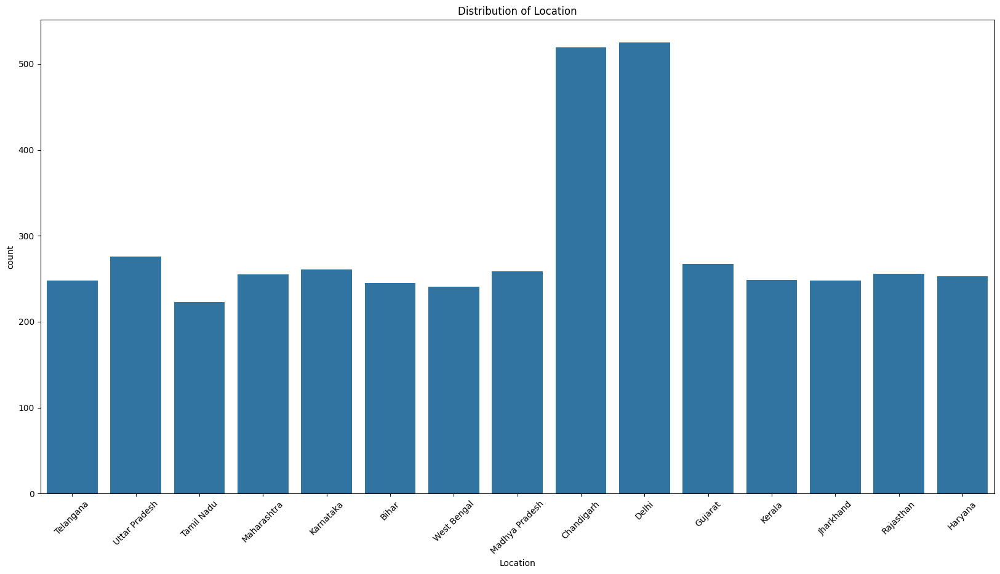

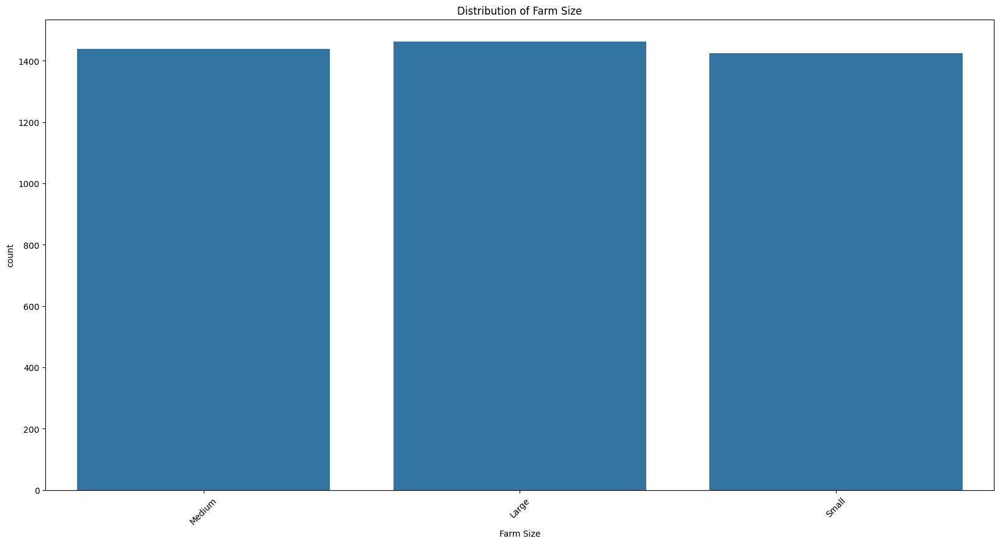

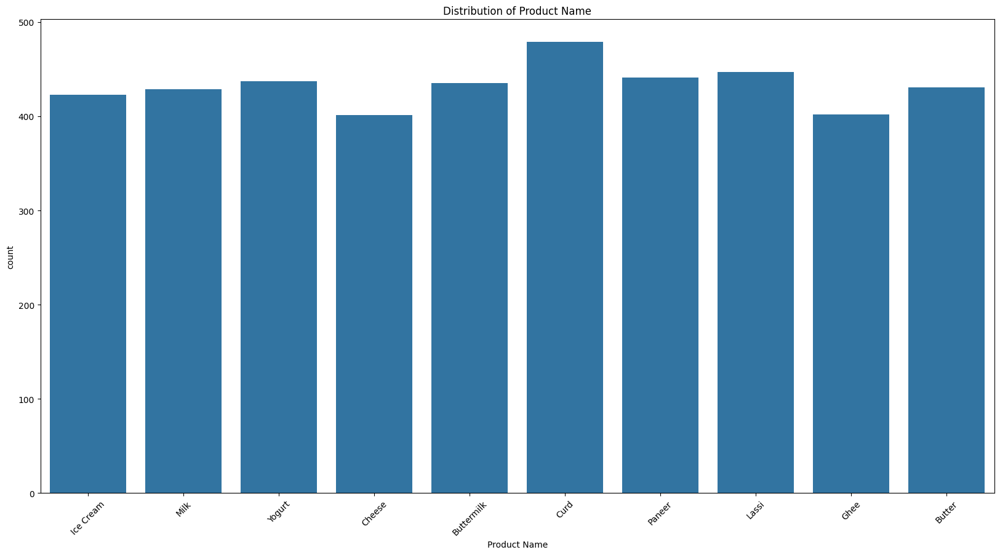

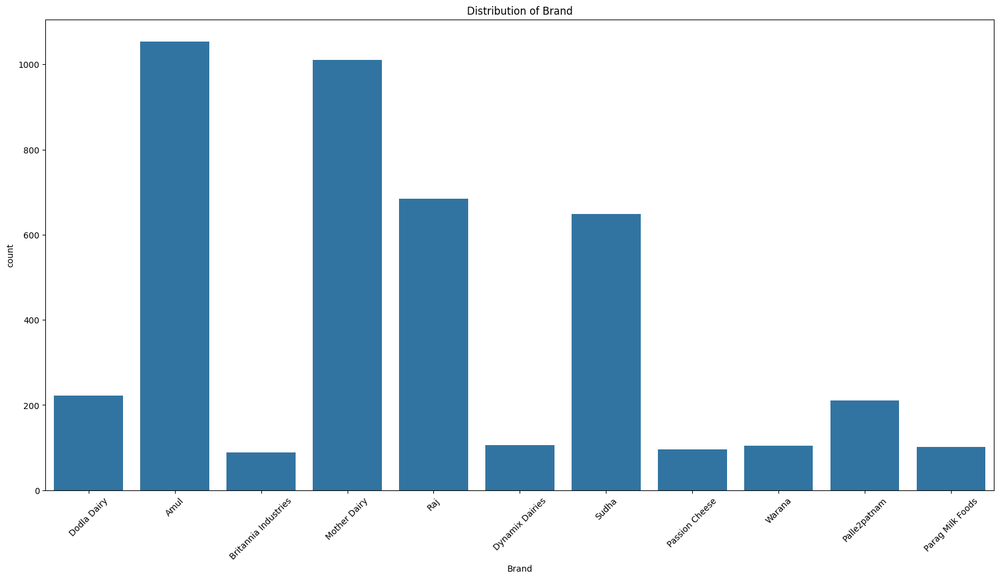

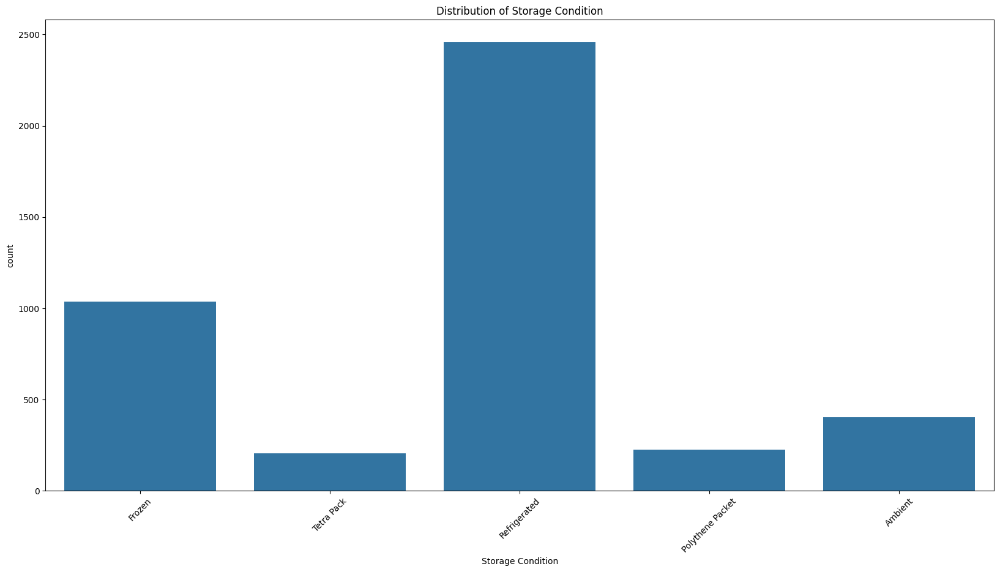

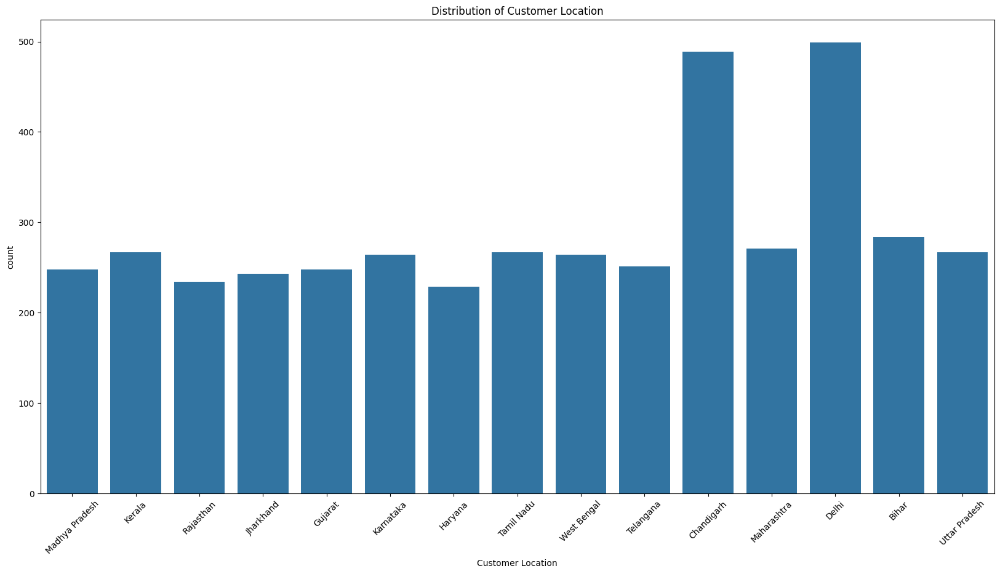

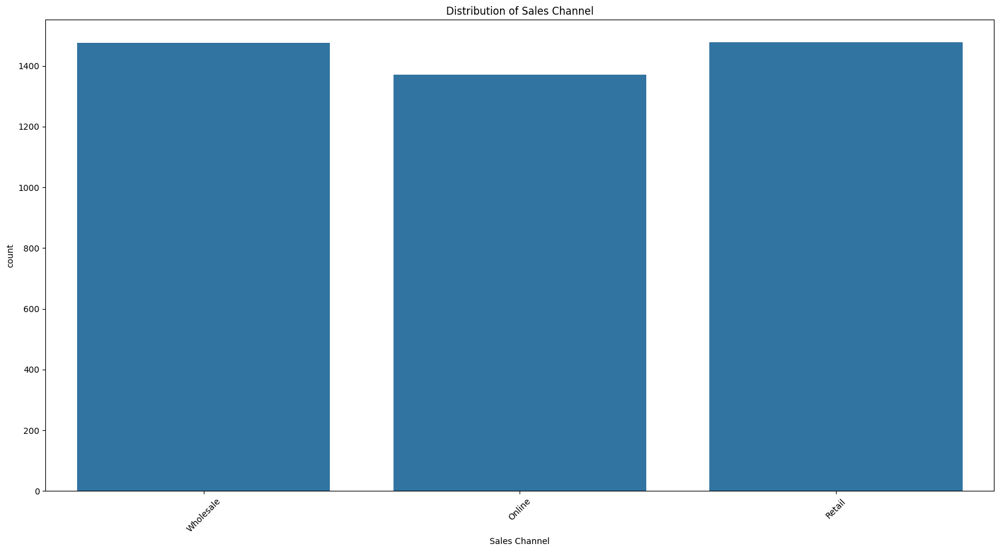

In [126]:
for column in categorical_columns:
    plt.figure(figsize=(20, 10))  # Adjust the figure size as needed
    sns.countplot(data=df, x=column)
    plt.title("Distribution of " + column)
    plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
    plt.show()

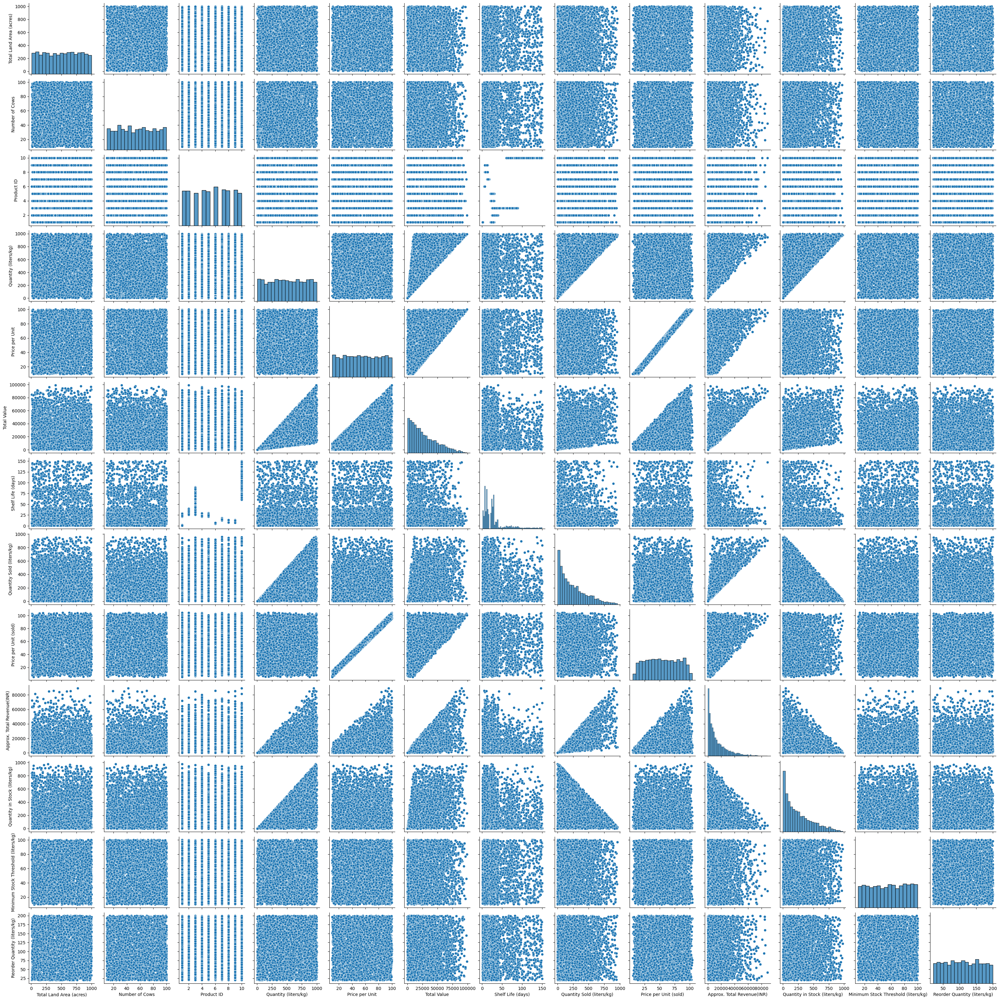

In [127]:
# # Create scatter plot matrix
# sns.pairplot(df)
# plt.show()

### Select Numerical Columns

In [128]:
# Select numerical columns
numerical_cols = df.select_dtypes(include=["float64", "int64"]).columns

### Distribution of Numerical Features

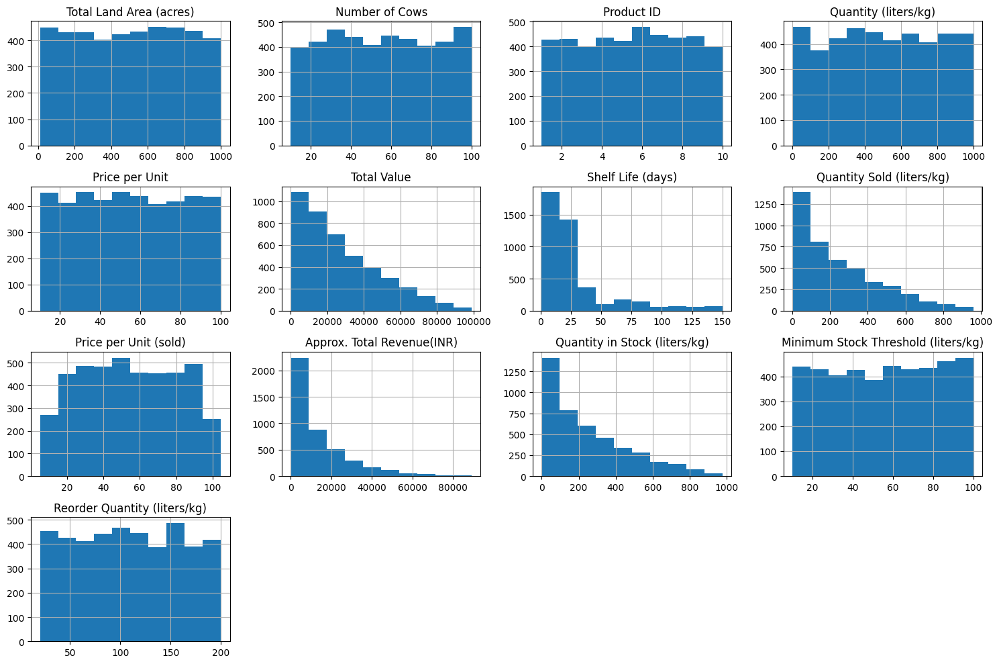

In [129]:
# Plot histograms for numerical features
df.hist(figsize=(15, 10))
plt.tight_layout()
plt.show()

### Draw heatmap to show correlation between each attributes

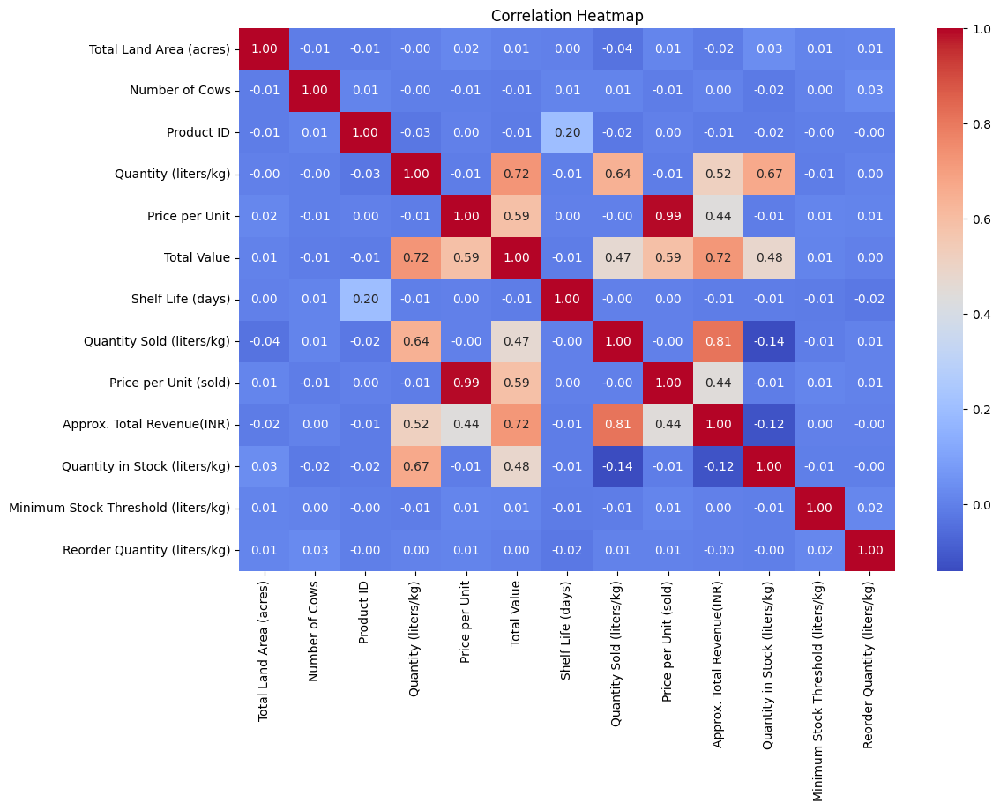

In [130]:
# Find columns have numeric values
numeric_columns = df.select_dtypes(include=['number'])

# Calculate correlation matrix
correlation_matrix = numeric_columns.corr()

# Draw heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

### Draw boxplot to Understanding data distribution and Check outlier

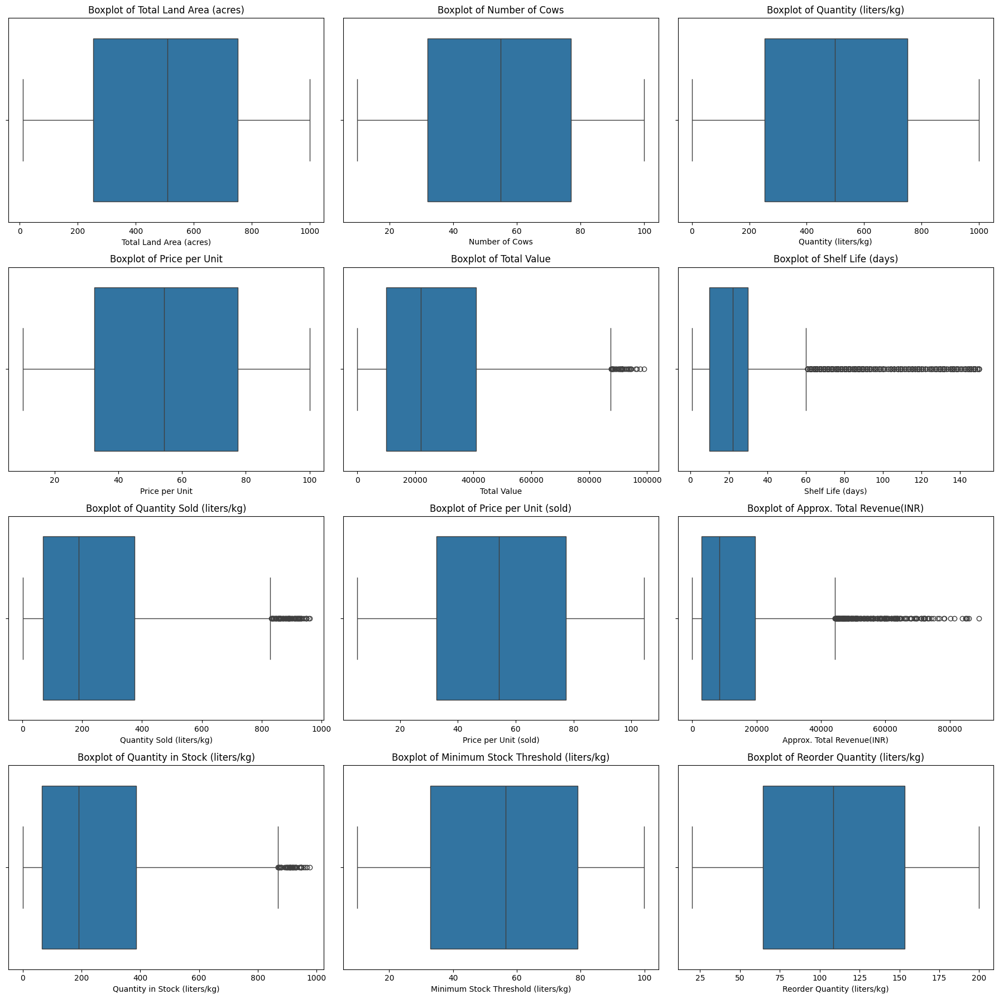

In [131]:
plt.figure(figsize=(18, 18))
for i, column in enumerate(numerical_columns, 1):
    plt.subplot(4, 3, i)  # Adjust the number of rows and columns
    sns.boxplot(x=df[column])
    plt.title(f'Boxplot of {column}')
    plt.xlabel(column)

plt.tight_layout()
plt.show()

### Calculate total number of outlier of each column

In [132]:
# Define the function to calculate the total number of outliers for each column
def count_outliers(column):
    q1 = df[column].quantile(0.25)
    q3 = df[column].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    return outliers.shape[0]

# Calculate and print the total number of outliers for each numerical column
for column in numerical_columns:
    total_outliers = count_outliers(column)
    print(f"Total outliers in '{column}': {total_outliers}")


Total outliers in 'Total Land Area (acres)': 0
Total outliers in 'Number of Cows': 0
Total outliers in 'Quantity (liters/kg)': 0
Total outliers in 'Price per Unit': 0
Total outliers in 'Total Value': 37
Total outliers in 'Shelf Life (days)': 578
Total outliers in 'Quantity Sold (liters/kg)': 71
Total outliers in 'Price per Unit (sold)': 0
Total outliers in 'Approx. Total Revenue(INR)': 225
Total outliers in 'Quantity in Stock (liters/kg)': 41
Total outliers in 'Minimum Stock Threshold (liters/kg)': 0
Total outliers in 'Reorder Quantity (liters/kg)': 0


In [133]:
def remove_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

# Áp dụng quy tắc IQR cho từng đặc trưng
for feature in numerical_features:
    df = remove_outliers(df, feature)

# Kiểm tra lại dữ liệu sau khi xử lý ngoại lai
print(df.describe())

       Total Land Area (acres)  Number of Cows   Product ID  \
count              3455.000000     3455.000000  3455.000000   
mean                502.471991       54.722431     5.143560   
std                 285.420837       26.134140     2.595974   
min                  10.170000       10.000000     1.000000   
25%                 257.480000       32.000000     3.000000   
50%                 505.210000       55.000000     5.000000   
75%                 749.645000       77.000000     7.000000   
max                 999.530000      100.000000    10.000000   

       Quantity (liters/kg)  Price per Unit   Total Value  Shelf Life (days)  \
count           3455.000000     3455.000000   3455.000000        3455.000000   
mean             472.374949       53.124732  24469.409483          18.774530   
std              280.658360       25.554880  19043.545607          11.982681   
min                1.170000       10.030000     42.516500           1.000000   
25%              233.790000     

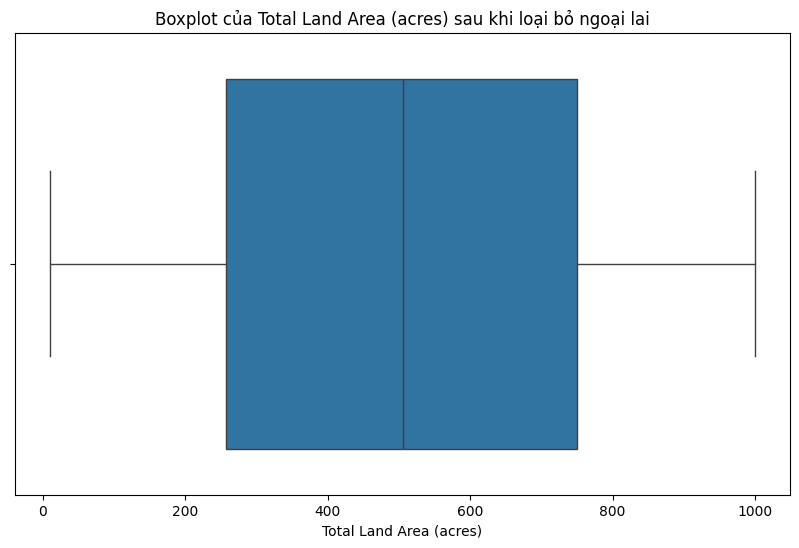

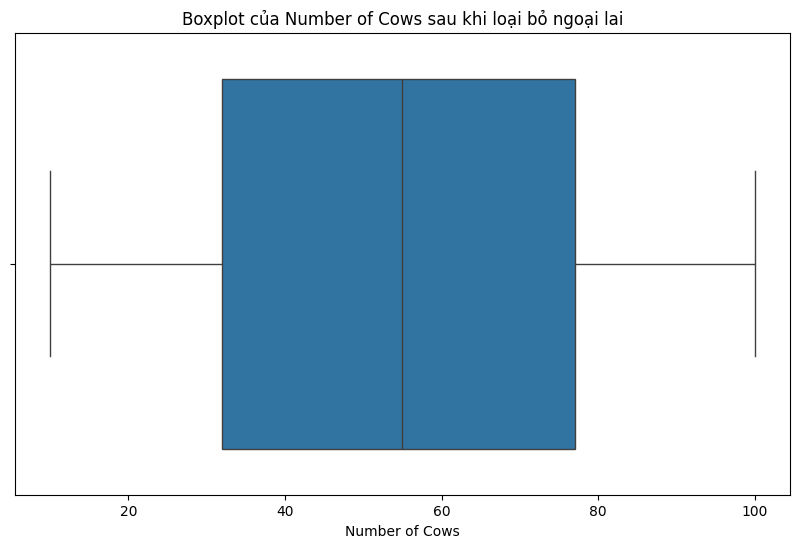

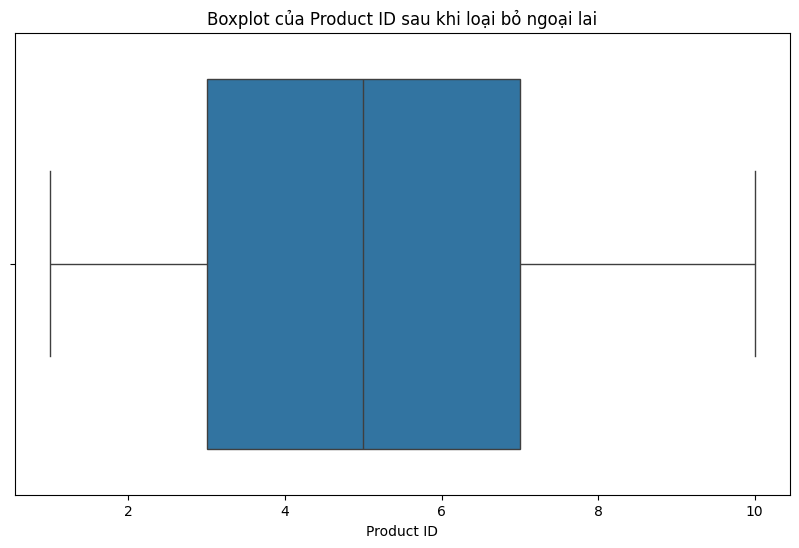

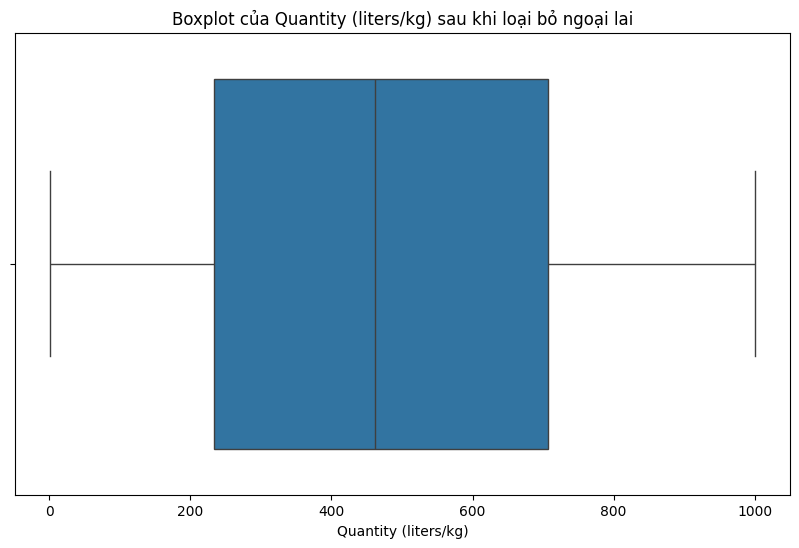

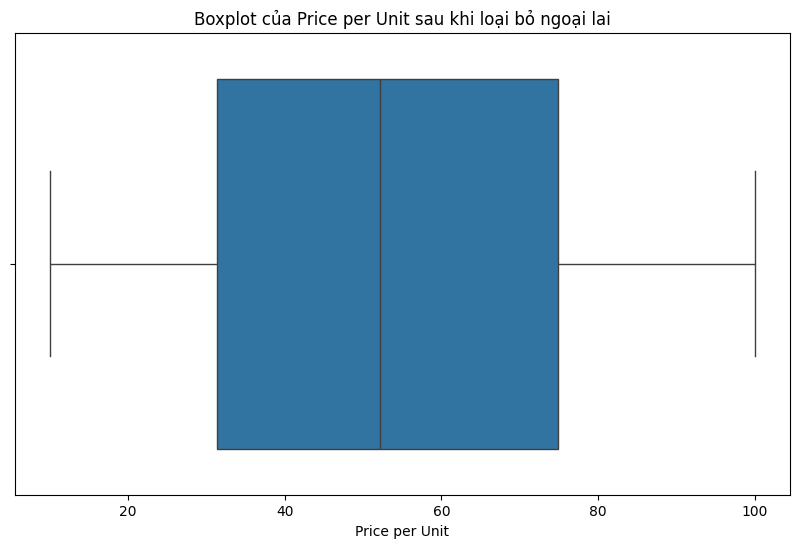

...

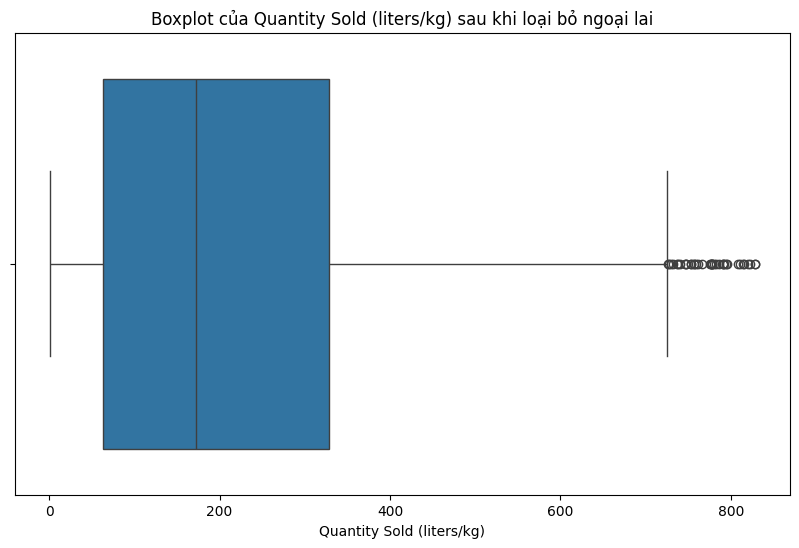

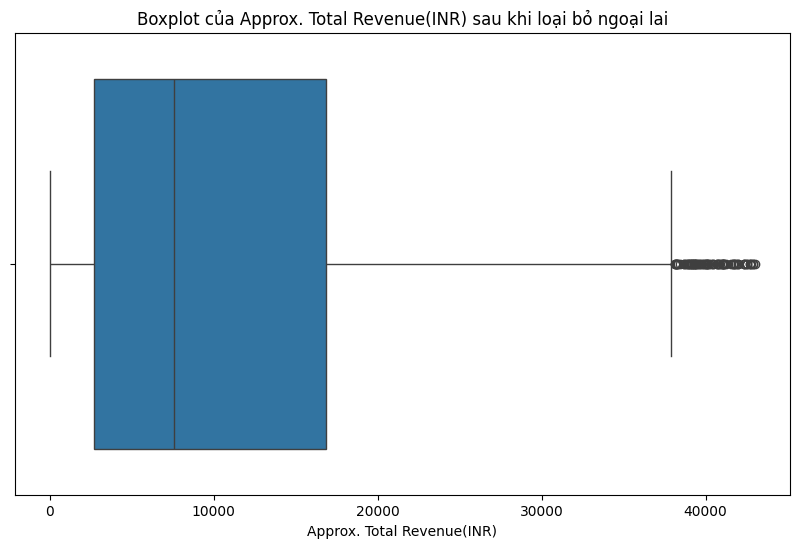

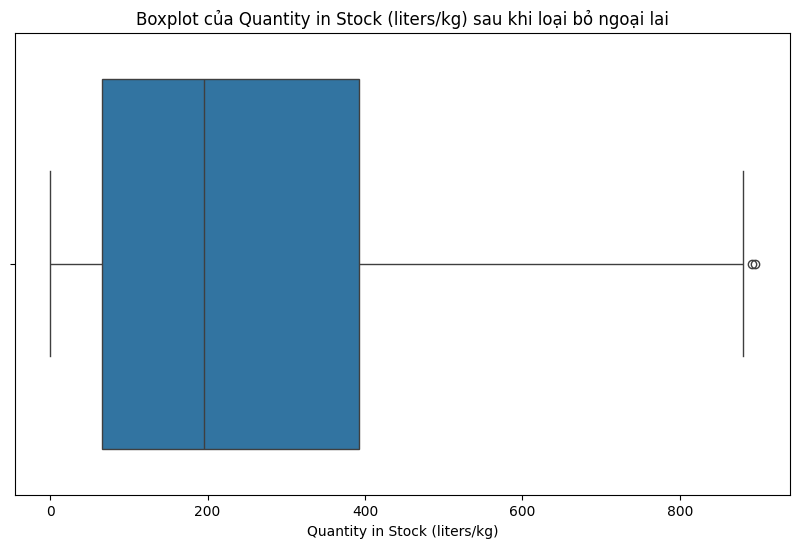

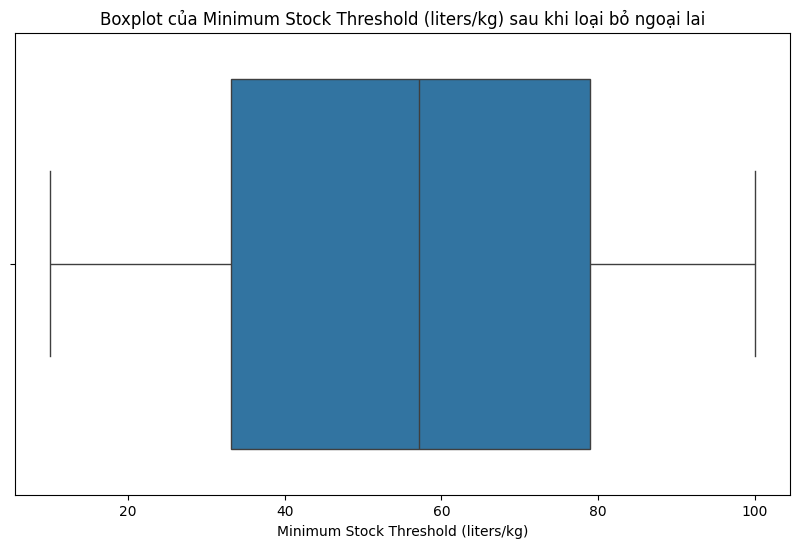

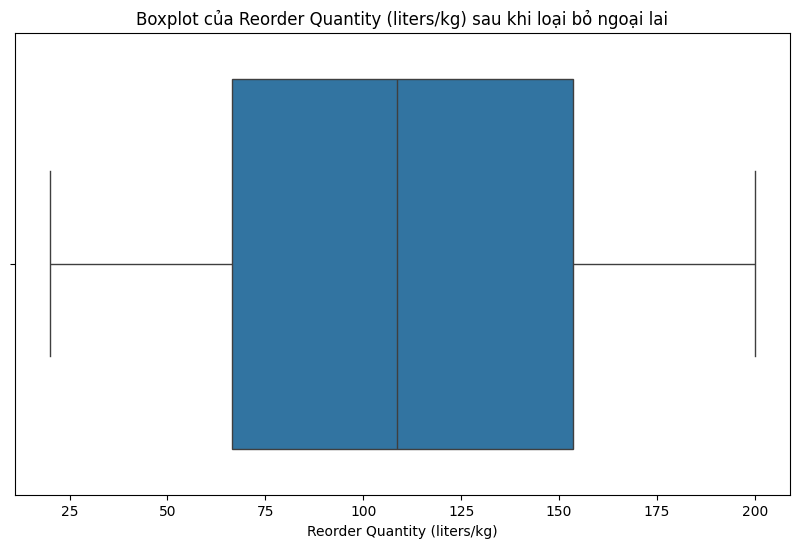

In [134]:
for feature in numerical_features:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=df[feature])
    plt.title(f"Boxplot của {feature} sau khi loại bỏ ngoại lai")
    plt.show()

In [168]:
# Define the function to calculate the total number of outliers for each column
def count_outliers(column):
    q1 = df[column].quantile(0.25)
    q3 = df[column].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    return outliers.shape[0]

# Calculate and print the total number of outliers for each numerical column
for column in numerical_columns:
    total_outliers = count_outliers(column)
    print(f"Total outliers in '{column}': {total_outliers}")

Total outliers in 'Total Land Area (acres)': 0
Total outliers in 'Number of Cows': 0
Total outliers in 'Quantity (liters/kg)': 0
Total outliers in 'Price per Unit': 0
Total outliers in 'Total Value': 35
Total outliers in 'Shelf Life (days)': 45
Total outliers in 'Quantity Sold (liters/kg)': 39
Total outliers in 'Price per Unit (sold)': 0
Total outliers in 'Approx. Total Revenue(INR)': 73
Total outliers in 'Quantity in Stock (liters/kg)': 2
Total outliers in 'Minimum Stock Threshold (liters/kg)': 0
Total outliers in 'Reorder Quantity (liters/kg)': 0


## Choose variable:


*   Categorical variable: Location
*   Quantitative variables: Quantity Sold (liters/kg) and Approx. Total Revenue(INR)



## Qualitative variable

### Frequency Table of Categorical variable(Location)

In [135]:
# Frequency table of the 'Category' column
frequency_table = df['Location'].value_counts().reset_index()
frequency_table.columns = ['Location', 'Frequency']

# Display the frequency table
print(frequency_table)

          Location  Frequency
0       Chandigarh        415
1            Delhi        412
2    Uttar Pradesh        219
3          Haryana        216
4          Gujarat        214
5        Rajasthan        206
6        Telangana        205
7        Karnataka        205
8      Maharashtra        203
9   Madhya Pradesh        202
10       Jharkhand        201
11           Bihar        199
12          Kerala        197
13     West Bengal        188
14      Tamil Nadu        173


<ipython-input-136-70330cfc75aa>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Location', y='Frequency', data=frequency_table, palette='viridis')


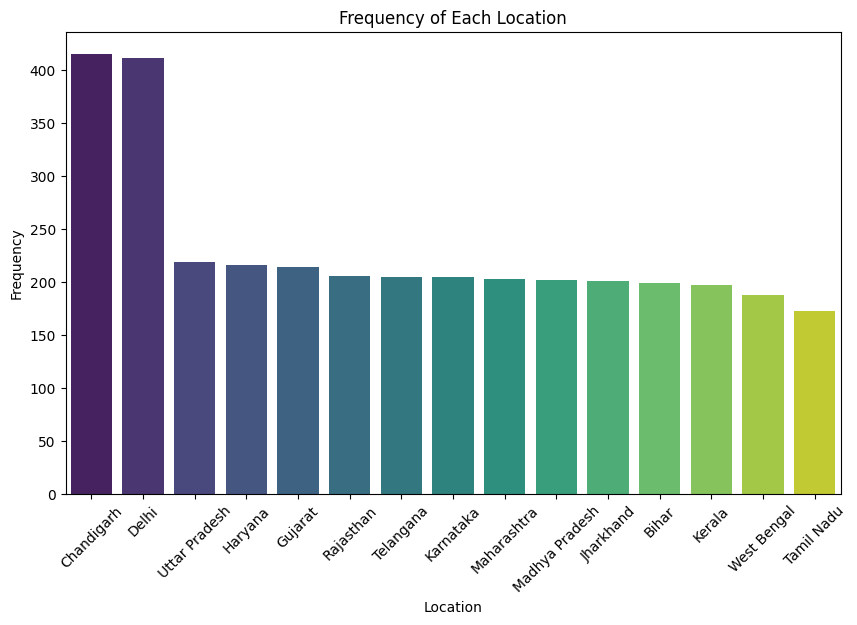

In [136]:
# Frequency table of the 'Category' column
frequency_table = df['Location'].value_counts().reset_index()
frequency_table.columns = ['Location', 'Frequency']

# Plotting the bar chart
plt.figure(figsize=(10, 6))
sns.barplot(x='Location', y='Frequency', data=frequency_table, palette='viridis')
plt.title('Frequency of Each Location')
plt.xlabel('Location')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.show()

### Pie Chart to show percentage of each Location

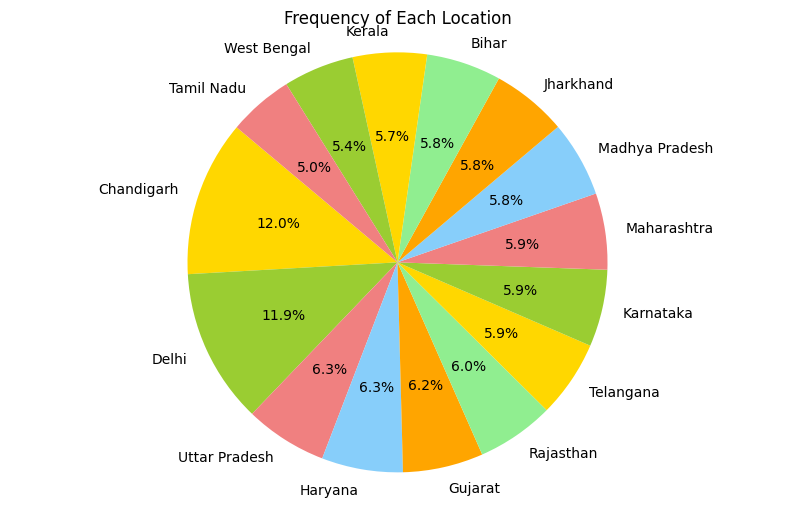

In [137]:
# Frequency table of the 'Category' column
frequency_table = df['Location'].value_counts()

# Define colors for each category
colors = ['gold', 'yellowgreen', 'lightcoral', 'lightskyblue', 'orange', 'lightgreen']

# Plotting the pie chart with custom colors
plt.figure(figsize=(10, 6))
plt.pie(frequency_table, labels=frequency_table.index, autopct='%1.1f%%', startangle=140, colors=colors)
plt.title('Frequency of Each Location')
plt.axis('equal')
plt.show()

In [138]:
# Find the mode of the 'Category' column
mode_category = df['Location'].mode()

# Count the occurrences of the mode
mode_count = df['Location'].value_counts()[mode_category[0]]

# Create a DataFrame to display the mode and its count
mode_df = pd.DataFrame({'Location': mode_category, 'Count': mode_count})

print("Mode of the 'Location' column:")
print(mode_df)

Mode of the 'Location' column:
     Location  Count
0  Chandigarh    415


### Find Mode of Location

### Draw Frequency Histogram For each column

<ipython-input-139-4dfb443a24cf>:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=column, y='Frequency', data=frequency_table, palette='viridis')
<ipython-input-139-4dfb443a24cf>:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=column, y='Frequency', data=frequency_table, palette='viridis')
<ipython-input-139-4dfb443a24cf>:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=column, y='Frequency', data=frequency_table, palette='viridis')
<ipython-input-139-4dfb443a24cf>:18: FutureWarning: 

Passing `palette` without assigning `hue` is d

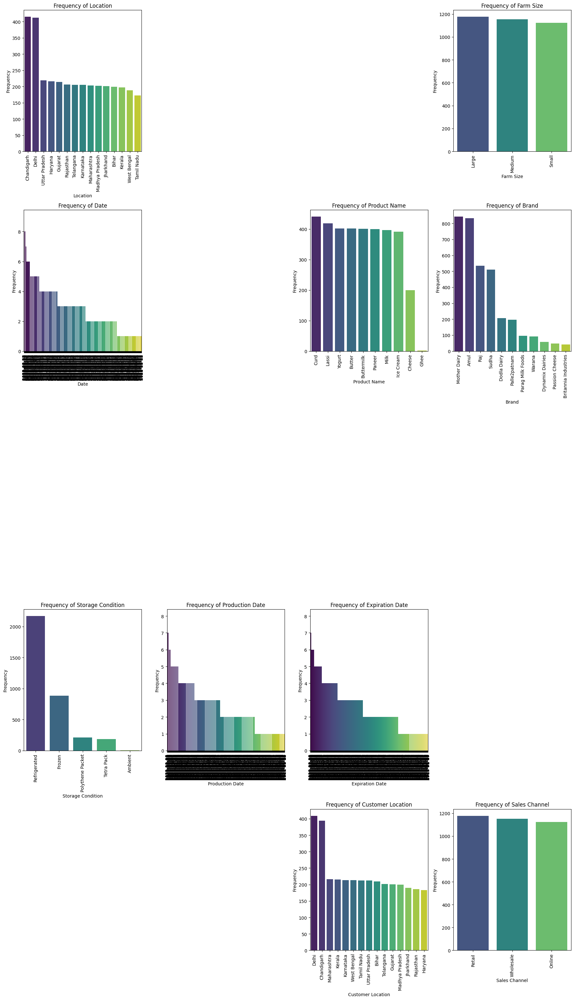

In [139]:
# Get a list of all the columns in the dataset
all_columns = df.columns.tolist()

# Calculate the number of rows and columns for the grid
num_columns = len(all_columns)
num_rows = (num_columns + 3) // 4  # Ceil the number of rows

# Create a figure with multiple subplots
plt.figure(figsize=(18, 6 * num_rows))

# Iterate over each column and create a bar chart
for i, column in enumerate(all_columns, 1):
    # Skip non-categorical columns
    if df[column].dtype == 'object':
        plt.subplot(num_rows, 4, i)
        frequency_table = df[column].value_counts().reset_index()
        frequency_table.columns = [column, 'Frequency']
        sns.barplot(x=column, y='Frequency', data=frequency_table, palette='viridis')
        plt.title(f'Frequency of {column}')
        plt.xlabel(column)
        plt.ylabel('Frequency')
        plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

## Quantitative variables

In [140]:
# Frequency table for 'Age' column
quantity_sold_frequency = df['Quantity Sold (liters/kg)'].value_counts().sort_index()

# Frequency table for 'Purchase Amount (USD)' column
Total_revenue_frequency = df['Approx. Total Revenue(INR)'].value_counts().sort_index()

quantity_sold_frequency,Total_revenue_frequency

(Quantity Sold (liters/kg)
 1      35
 2      32
 3      15
 4      24
 5      25
        ..
 814     1
 816     1
 820     1
 823     1
 828     2
 Name: count, Length: 669, dtype: int64,
 Approx. Total Revenue(INR)
 12.54       1
 14.99       1
 16.30       1
 17.46       1
 19.66       1
            ..
 42699.74    1
 42791.55    1
 42906.60    1
 42912.48    1
 42988.40    1
 Name: count, Length: 3438, dtype: int64)

In [141]:
Quantity_Sold_stat = df['Quantity Sold (liters/kg)'].describe()
print(Quantity_Sold_stat)

count    3455.000000
mean      218.542692
std       185.389992
min         1.000000
25%        63.000000
50%       172.000000
75%       328.000000
max       828.000000
Name: Quantity Sold (liters/kg), dtype: float64


In [142]:
Total_revenue_stat = df['Approx. Total Revenue(INR)'].describe()
print(Total_revenue_stat)

count     3455.000000
mean     11016.886368
std      10438.750526
min         12.540000
25%       2705.370000
50%       7579.500000
75%      16821.055000
max      42988.400000
Name: Approx. Total Revenue(INR), dtype: float64


### Draw chart to show Frequency of Quantity Sold

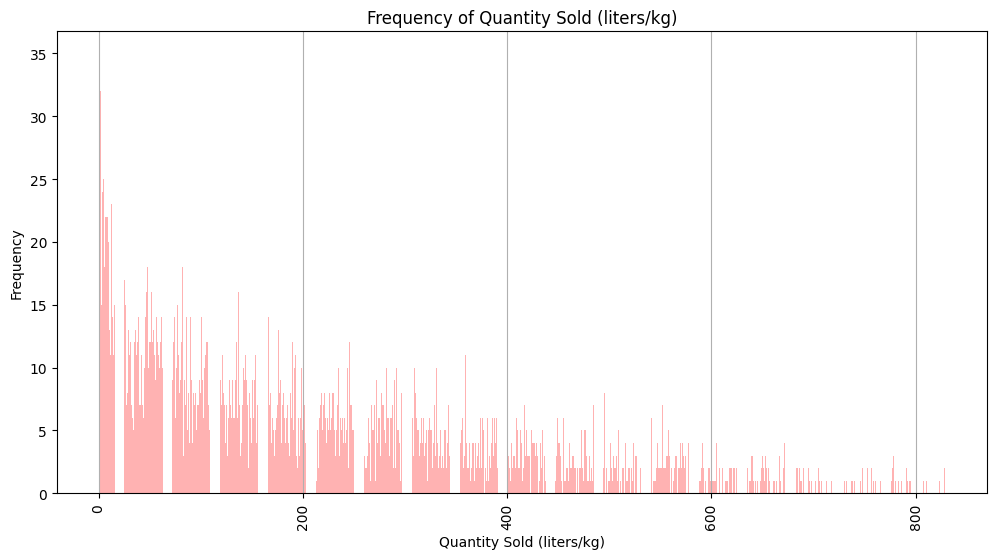

In [143]:
plt.figure(figsize=(12, 6))
plt.bar(quantity_sold_frequency.index, quantity_sold_frequency.values, color='red', alpha=0.3)  # Set the color to blue
plt.xlabel('Quantity Sold (liters/kg)')
plt.ylabel('Frequency')
plt.title('Frequency of Quantity Sold (liters/kg)')
plt.xticks(rotation=90)
plt.grid(axis='x')

plt.show()

### Purchase Amount Frequency Bar Chart

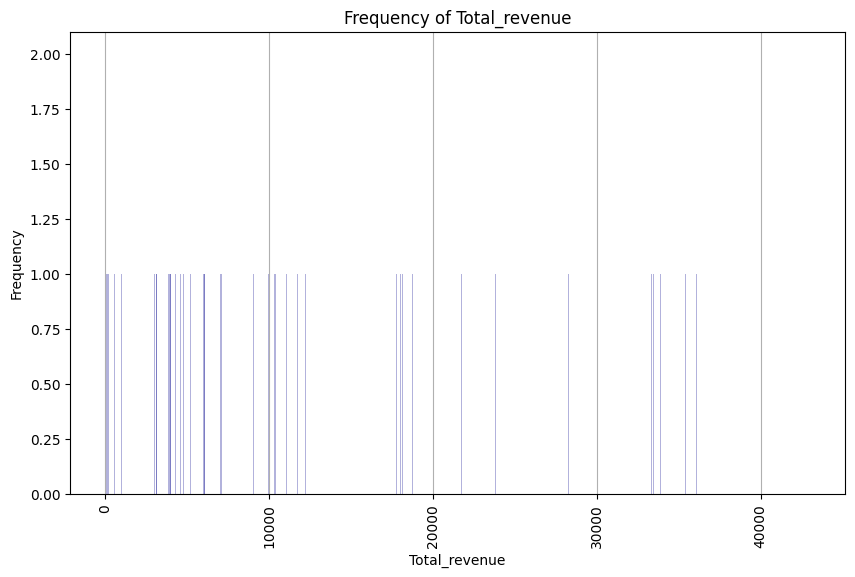

In [144]:
plt.figure(figsize=(10, 6))
plt.bar(Total_revenue_frequency.index, Total_revenue_frequency.values, color='darkblue', alpha = 0.3)
plt.xlabel('Total_revenue')
plt.ylabel('Frequency')
plt.title('Frequency of Total_revenue')
plt.xticks(rotation=90)
plt.grid(axis='x')
plt.show()

### Checking Outlier of Quantity Sold

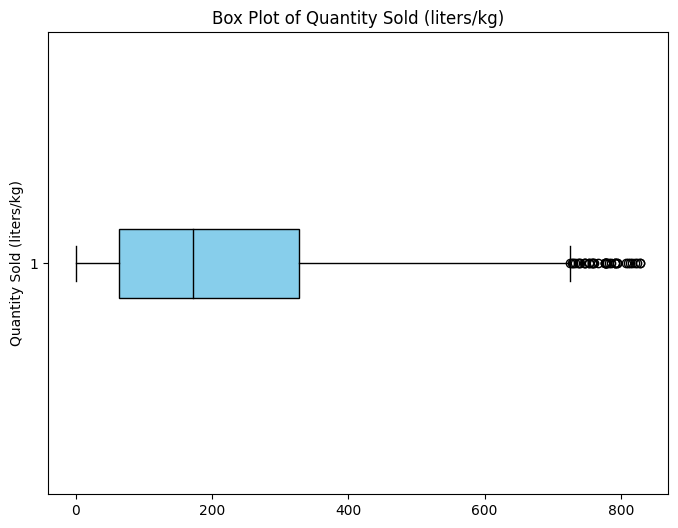

In [145]:
# Define box and whisker colors
box_color = 'skyblue'

# Create a horizontal box plot for quantity_sold_frequency with color
plt.figure(figsize=(8, 6))
plt.boxplot(df['Quantity Sold (liters/kg)'], vert=False, patch_artist=True,
            boxprops=dict(facecolor=box_color, color='black'),
            medianprops=dict(color='black'))

plt.ylabel('Quantity Sold (liters/kg)')
plt.title('Box Plot of Quantity Sold (liters/kg)')


plt.show()

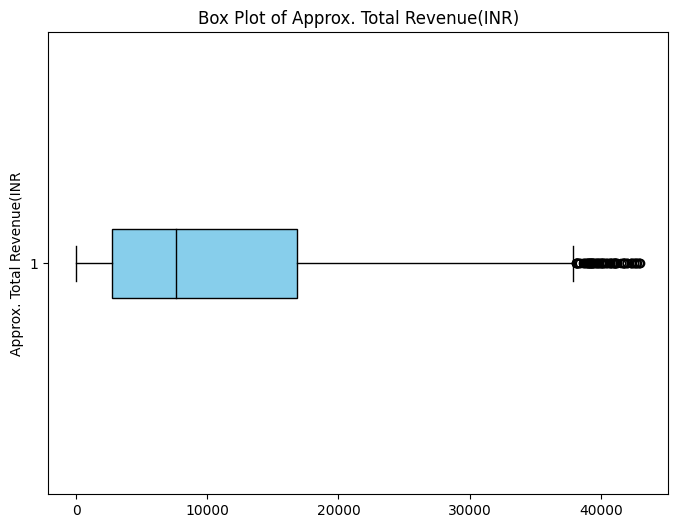

In [146]:
# Define box and whisker colors
box_color = 'skyblue'


# Create a horizontal box plot for quantity_sold_frequency with color
plt.figure(figsize=(8, 6))
plt.boxplot(df['Approx. Total Revenue(INR)'], vert=False, patch_artist=True,
            boxprops=dict(facecolor=box_color, color='black'),
            medianprops=dict(color='black'))

plt.ylabel('Approx. Total Revenue(INR')
plt.title('Box Plot of Approx. Total Revenue(INR)')


plt.show()

Choose:

x: Quantity Sold (liters/kg)

y: Approx. Total Revenue(INR)

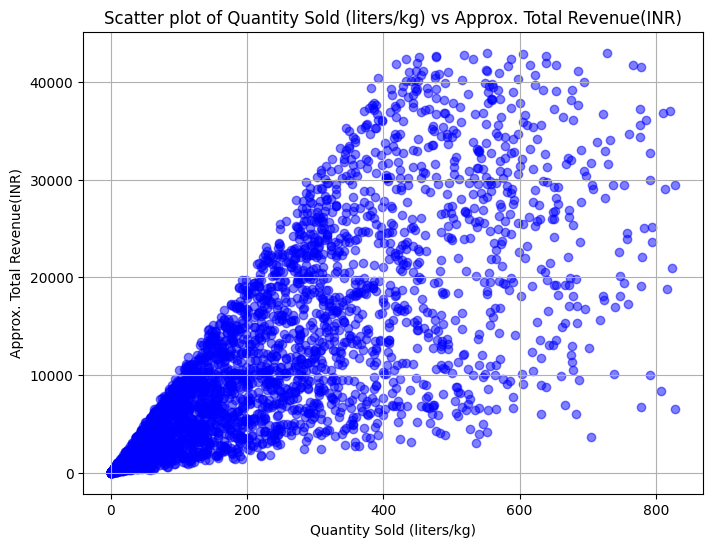

In [147]:
# Define x and y
x = df['Quantity Sold (liters/kg)']
y = df['Approx. Total Revenue(INR)']

# Draw scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(x, y, color='blue', alpha=0.5)
plt.title('Scatter plot of Quantity Sold (liters/kg) vs Approx. Total Revenue(INR)')
plt.xlabel('Quantity Sold (liters/kg)')
plt.ylabel('Approx. Total Revenue(INR)')
plt.grid(True)
plt.show()

In [148]:
# Independent variable: Quantity Sold (liters/kg), Dependent variable: Approx. Total Revenue(INR)
X1 = df['Quantity Sold (liters/kg)']
y1 = df['Approx. Total Revenue(INR)']
X1 = sm.add_constant(X1)  # add Intercept

# Train linear regression model
model1 = sm.OLS(y1, X1).fit()

# Show the result
print("Model 1 (Quantity Sold (liters/kg) as independent variable and Approx. Total Revenue(INR) as dependent variable):")
print(model1.summary())


Model 1 (Quantity Sold (liters/kg) as independent variable and Approx. Total Revenue(INR) as dependent variable):
                                OLS Regression Results                                
Dep. Variable:     Approx. Total Revenue(INR)   R-squared:                       0.594
Model:                                    OLS   Adj. R-squared:                  0.594
Method:                         Least Squares   F-statistic:                     5051.
Date:                        Wed, 12 Jun 2024   Prob (F-statistic):               0.00
Time:                                18:26:04   Log-Likelihood:                -35315.
No. Observations:                        3455   AIC:                         7.063e+04
Df Residuals:                            3453   BIC:                         7.065e+04
Df Model:                                   1                                         
Covariance Type:                    nonrobust                                         
                

In [149]:
intercept = model1.params['const']
slope = model1.params['Quantity Sold (liters/kg)']

# In phương trình hồi quy
print(f"Linear Regression equation: Approx. Total Revenue (INR) = {intercept:.4f} + {slope:.4f} * Quantity Sold (liters/kg)")

Linear Regression equation: Approx. Total Revenue (INR) = 1533.4110 + 43.3942 * Quantity Sold (liters/kg)


In [150]:
X1 = df['Quantity Sold (liters/kg)']
y1 = df['Approx. Total Revenue(INR)']
X_train, X_test, y_train, y_test = train_test_split(X1, y1, test_size=0.2, random_state=42)

# Add Intercept to train and test
X_train = sm.add_constant(X_train)
X_test = sm.add_constant(X_test)

# Train Linear Regression Model
model = sm.OLS(y_train, X_train).fit()

# Predicted
y_pred = model.predict(X_test)

# Calculate performance of model
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r_squared = model.rsquared

# Show the result
print("R-squared:", r_squared)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)

R-squared: 0.5896866721912205
Mean Squared Error (MSE): 43196410.34009369
Root Mean Squared Error (RMSE): 6572.397609707868


In [151]:
# Independent variable: Approx. Total Revenue(INR), Dependent variable: Quantity Sold (liters/kg)
X2 = df['Approx. Total Revenue(INR)']
y2 = df['Quantity Sold (liters/kg)']
X2 = sm.add_constant(X2)  # Thêm hệ số chặn

# Train Linear Regression Model
model2 = sm.OLS(y2, X2).fit()


# Show result
print("Model 2 (Approx. Total Revenue(INR) as independent variable and Quantity Sold (liters/kg) as dependent variable):")
print(model2.summary())


Model 2 (Approx. Total Revenue(INR) as independent variable and Quantity Sold (liters/kg) as dependent variable):
                                OLS Regression Results                               
Dep. Variable:     Quantity Sold (liters/kg)   R-squared:                       0.594
Model:                                   OLS   Adj. R-squared:                  0.594
Method:                        Least Squares   F-statistic:                     5051.
Date:                       Wed, 12 Jun 2024   Prob (F-statistic):               0.00
Time:                               18:26:04   Log-Likelihood:                -21389.
No. Observations:                       3455   AIC:                         4.278e+04
Df Residuals:                           3453   BIC:                         4.279e+04
Df Model:                                  1                                         
Covariance Type:                   nonrobust                                         
                          

In [152]:
# Split data and predicted
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y2, test_size=0.2, random_state=42)
model2 = sm.OLS(y_train2, X_train2).fit()
y_pred2 = model.predict(X_test2)

# Calculate model performance
mse = mean_squared_error(y_test2, y_pred2)
rmse = np.sqrt(mse)

# Show the result
print("R-squared:", model.rsquared)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)

R-squared: 0.5896866721912205
Mean Squared Error (MSE): 435021168737.9056
Root Mean Squared Error (RMSE): 659561.3456972032


### Remove outliers

In [153]:
# Find 'Quantity Sold (liters/kg)' IQR
Q1 = df['Quantity Sold (liters/kg)'].quantile(0.25)
Q3 = df['Quantity Sold (liters/kg)'].quantile(0.75)
IQR = Q3 - Q1

# Identify outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR


In [154]:
df_no_outliers = df[(df['Quantity Sold (liters/kg)'] >= lower_bound) & (df['Quantity Sold (liters/kg)'] <= upper_bound)]

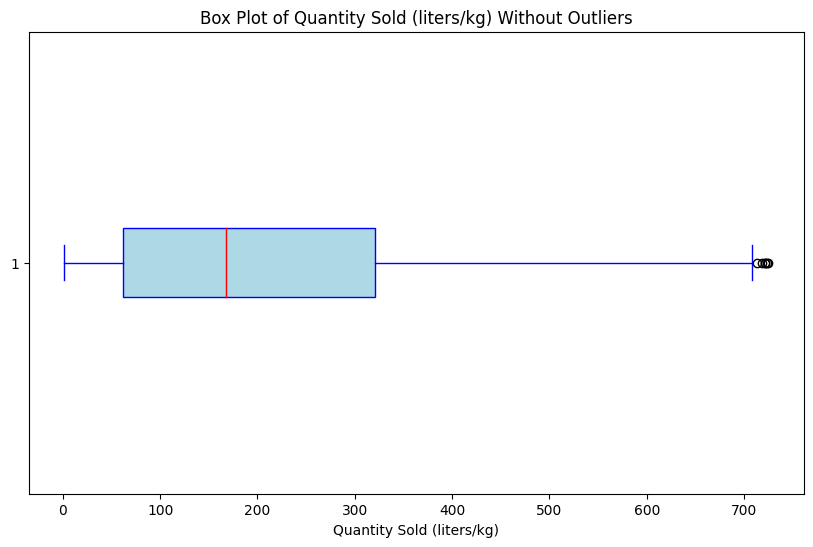

In [155]:
# Draw box plot for 'Quantity Sold (liters/kg)' after remove outliers
plt.figure(figsize=(10, 6))
plt.boxplot(df_no_outliers['Quantity Sold (liters/kg)'], vert=False, patch_artist=True,
            boxprops=dict(facecolor='lightblue', color='blue'),
            medianprops=dict(color='red'),
            whiskerprops=dict(color='blue'),
            capprops=dict(color='blue'))
plt.xlabel('Quantity Sold (liters/kg)')
plt.title('Box Plot of Quantity Sold (liters/kg) Without Outliers')
plt.show()

In [156]:
# Independent variable: Quantity Sold (liters/kg), Dependent variable: Approx. Total Revenue (INR)
X = df_no_outliers['Quantity Sold (liters/kg)']
y = df_no_outliers['Approx. Total Revenue(INR)']
X = sm.add_constant(X)  # add Intercept

# Train Linear Regression Model
model = sm.OLS(y, X).fit()

# Show the result
print(model.summary())

                                OLS Regression Results                                
Dep. Variable:     Approx. Total Revenue(INR)   R-squared:                       0.601
Model:                                    OLS   Adj. R-squared:                  0.601
Method:                         Least Squares   F-statistic:                     5135.
Date:                        Wed, 12 Jun 2024   Prob (F-statistic):               0.00
Time:                                18:26:04   Log-Likelihood:                -34849.
No. Observations:                        3416   AIC:                         6.970e+04
Df Residuals:                            3414   BIC:                         6.971e+04
Df Model:                                   1                                         
Covariance Type:                    nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------

In [157]:
# Split data and predicted
X_train1, X_test1, y_train1, y_test1 = train_test_split(X, y, test_size=0.2, random_state=42)
model1 = sm.OLS(y_train1, X_train1).fit()
y_pred1 = model.predict(X_test1)

# Calculate model performance
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

# Show the result
print("R-squared:", model.rsquared)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)

R-squared: 0.6006627659067676
Mean Squared Error (MSE): 43196410.34009369
Root Mean Squared Error (RMSE): 6572.397609707868


## Check residuals for 4 assumptions

### Assumption 1: Linearity

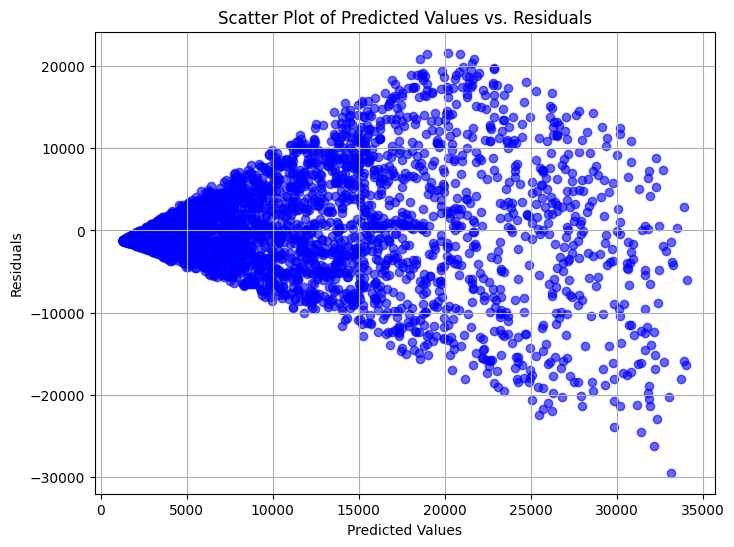

In [158]:
# Scatter plot giữa giá trị dự đoán và residuals

# Tính các giá trị dự đoán
predicted_values = model.predict(X)

# Tính residuals
residuals = y - predicted_values
plt.figure(figsize=(8, 6))
plt.scatter(predicted_values, residuals, alpha=0.6, c='blue')

plt.title('Scatter Plot of Predicted Values vs. Residuals')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.grid(True)
plt.show()

### Assumption 2: Independent

In [159]:
# Xây dựng mô hình hồi quy và fit dữ liệu
model1 = sm.OLS(y1, X1).fit()

# Tính toán giá trị Durbin-Watson
dw_test = sm.stats.stattools.durbin_watson(model.resid)

# In ra giá trị Durbin-Watson
print("Durbin-Watson test statistic:", dw_test)

# Kiểm tra giả định về tính độc lập của các quan sát
if dw_test < 1.5:
    print("Positive autocorrelation detected (values < 1.5)")
elif dw_test > 2.5:
    print("Negative autocorrelation detected (values > 2.5)")
else:
    print("No autocorrelation detected (values between 1.5 and 2.5)")


Durbin-Watson test statistic: 2.002640006440611
No autocorrelation detected (values between 1.5 and 2.5)


### Assumption 3: Homoscedasticity

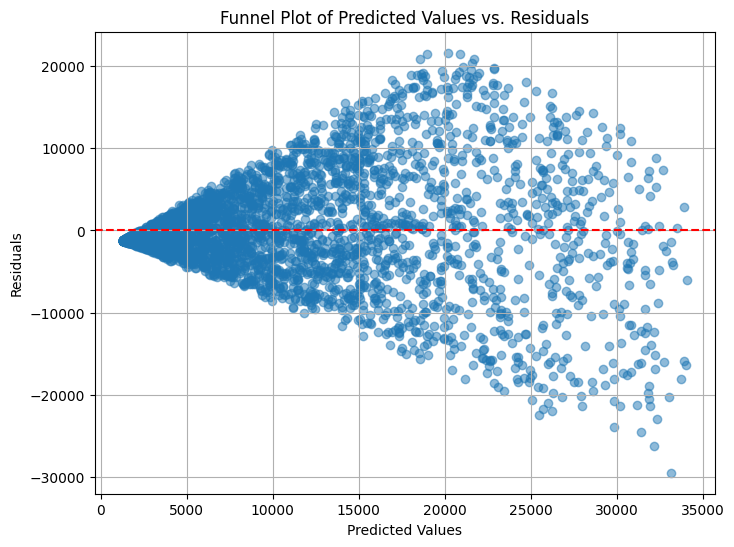

In [160]:
# Tính các giá trị dự đoán
predicted_values = model.predict(X)

# Tính residuals
residuals = y - predicted_values

# Vẽ biểu đồ phân tán giữa giá trị dự đoán và residuals
plt.figure(figsize=(8, 6))
plt.scatter(predicted_values, residuals, alpha=0.5)
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Funnel Plot of Predicted Values vs. Residuals')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.grid(True)
plt.show()

### Assumption 4: Normality of Errors

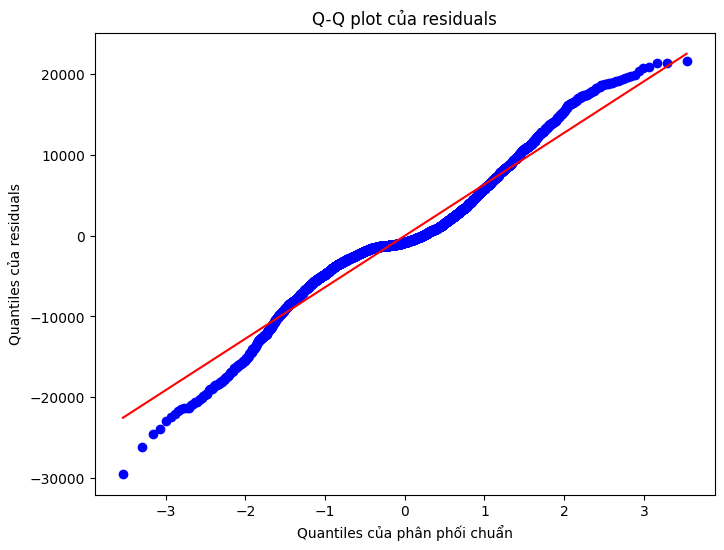

In [161]:
# Tạo Q-Q plot
fig, ax = plt.subplots(figsize=(8, 6))
stats.probplot(residuals, dist="norm", plot=ax)
ax.set_title('Q-Q plot của residuals')
ax.set_xlabel('Quantiles của phân phối chuẩn')
ax.set_ylabel('Quantiles của residuals')

# Hiển thị plot
plt.show()

## Build and Compare Model to Predict Price (sold) based on other features

### Prepare Data

In [172]:
# Identify the features and target variable
X = df.drop(columns=['Price per Unit (sold)', 'Date', 'Production Date', 'Expiration Date'])
y = df['Price per Unit (sold)']

# Separate categorical and numerical features
categorical_features = X.select_dtypes(include=['object']).columns.tolist()
numerical_features = X.select_dtypes(include=['int64', 'float64']).columns.tolist()

# Create a preprocessor for the pipeline
preprocessor = ColumnTransformer(
    transformers=[
        ('num', SimpleImputer(strategy='median'), numerical_features),
        ('cat', Pipeline(steps=[
            ('imputer', SimpleImputer(strategy='most_frequent')),
            ('onehot', OneHotEncoder(handle_unknown='ignore'))
        ]), categorical_features)
    ])

### Train Model

In [163]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Apply the preprocessor to the training data
X_train_preprocessed = preprocessor.fit_transform(X_train)
X_test_preprocessed = preprocessor.transform(X_test)

# Convert the preprocessed data back to DataFrame for better handling
X_train_preprocessed = pd.DataFrame(X_train_preprocessed.toarray())
X_test_preprocessed = pd.DataFrame(X_test_preprocessed.toarray())

# Display the shape of the preprocessed data
X_train_preprocessed.shape, X_test_preprocessed.shape

((2764, 74), (691, 74))

In [164]:
# Train Model using Linear Regression
lr_model1 = LinearRegression()
lr_model1.fit(X_train_preprocessed, y_train)

# Train Model using Random Forest
rf_model1 = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model1.fit(X_train_preprocessed, y_train)

RandomForestRegressor(random_state=42)

### Compare Model Performance

In [165]:
# Prediction on test set
y_pred_lr = lr_model1.predict(X_test_preprocessed)
y_pred_rf = rf_model1.predict(X_test_preprocessed)

# Linear Regression Model Evaluation
mse_lr = mean_squared_error(y_test, y_pred_lr)
r2_lr = r2_score(y_test, y_pred_lr)

print(f"Linear Regression - MSE: {mse_lr}, R^2: {r2_lr}")

# Random Forest Model Evaluation
mse_rf = mean_squared_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)

print(f"Random Forest - MSE: {mse_rf}, R^2: {r2_rf}")


Linear Regression - MSE: 7.873228341158675, R^2: 0.98775433752563
Random Forest - MSE: 8.726570320000008, R^2: 0.9864270880930848


### Model Conclusion:

From the data on the two models, Linear Regression and Random Forest, we can draw the following conclusions:

1. **Performance of Linear Regression and Random Forest models**:
   - The Linear Regression model has a Mean Squared Error (MSE) of 7.8732 and an R-squared (R²) of 0.98775.
   - The Random Forest model has a Mean Squared Error (MSE) of 8.72657 and an R-squared (R²) of 0.9864.

2. **Comparing MSE**:
   - MSE measures the average squared difference between predicted and actual values. A lower MSE indicates higher accuracy.
   - Linear Regression has a lower MSE (7.8732 vs. 8.72657), indicating that this model is slightly more accurate than Random Forest.

3. **Comparing R-squared**:
   - R-squared (R²) measures how well the model explains the variance of the dependent variable. An R² closer to 1 indicates a better fit.
   - Linear Regression has a higher R² (0.98775 vs. 0.9864), indicating that this model explains the data slightly better than Random Forest.

4. **Conclusion**:
   - Both models perform very well, with R² values over 0.98, indicating they explain over 98% of the variance in the dependent variable.
   - However, the Linear Regression model has slightly better overall performance with a lower MSE and higher R².

**In summary**, based on the given performance metrics, the Linear Regression model performs slightly better than the Random Forest model in predicting the data.

### Find Linear Regression Equation

In [181]:
# X = df.select_dtypes(include=["float64", "int64"]).columns
X = df.select_dtypes(include=["float64", "int64"])
X = X.drop(columns=['Price per Unit (sold)'])
y = df['Price per Unit (sold)']

# Add an intercept column to the X matrix
X = sm.add_constant(X)

# Train linear regression model
new_model = sm.OLS(y, X).fit()

# Show the result
print("Least Square Equation to predicted Price (sold):")
print(new_model.summary())

Least Square Equation to predicted Price (sold):
                              OLS Regression Results                             
Dep. Variable:     Price per Unit (sold)   R-squared:                       0.988
Model:                               OLS   Adj. R-squared:                  0.988
Method:                    Least Squares   F-statistic:                 2.362e+04
Date:                   Wed, 12 Jun 2024   Prob (F-statistic):               0.00
Time:                           18:43:43   Log-Likelihood:                -8479.3
No. Observations:                   3455   AIC:                         1.698e+04
Df Residuals:                       3442   BIC:                         1.706e+04
Df Model:                             12                                         
Covariance Type:               nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------

In [182]:
# Print the linear regression equation
print('The linear regression equation is:')
print(new_model.params)

The linear regression equation is:
const                                  0.251045
Total Land Area (acres)               -0.000364
Number of Cows                        -0.000549
Product ID                            -0.002992
Quantity (liters/kg)                   0.210013
Price per Unit                         0.994700
Total Value                           -0.000056
Shelf Life (days)                      0.005338
Quantity Sold (liters/kg)             -0.214836
Approx. Total Revenue(INR)             0.000153
Quantity in Stock (liters/kg)         -0.206945
Minimum Stock Threshold (liters/kg)    0.002875
Reorder Quantity (liters/kg)          -0.001497
dtype: float64


## Find Confident Interval of 95%

In [166]:
# Calculate the mean and standard deviation
mean = df[column].mean()
std_dev = df[column].std()

# Set the confidence level (e.g., 95%)
confidence_level = 0.95

# Calculate the degrees of freedom
df_count = len(df)
degrees_of_freedom = df_count - 1

# Calculate the critical t-value
critical_t = t.ppf((1 + confidence_level) / 2, degrees_of_freedom)

# Calculate the margin of error
margin_of_error = critical_t * (std_dev / (df_count ** 0.5))

# Calculate the lower and upper bounds of the CI
lower_bound = mean - margin_of_error
upper_bound = mean + margin_of_error

print(f"Confidence Interval ({confidence_level * 100}%):")
print(f"Lower Bound: {lower_bound:.4f}")
print(f"Upper Bound: {upper_bound:.4f}")

Confidence Interval (95.0%):
Lower Bound: 107.9081
Upper Bound: 111.3179


## Hypothesis Testing

#### Test 1:

H0 (Null Hypothesis): The mean price per unit of the dairy products is less than or equal to 50 dolars.

H1 (Alternative Hypothesis): The mean price per unit of the dairy products is greater than 50 dolars.

In [167]:
# Choose the column for the test
column = 'Price per Unit (sold)'

# Set the hypothesized mean value
hypothesized_mean = 50

# Perform the one-sample t-test
t_statistic, p_value = ttest_1samp(df[column], hypothesized_mean)

# Interpret the results
alpha = 0.05  # Significance level
if p_value < alpha:
    print(f"Reject the null hypothesis. The mean {column} is greater than ${hypothesized_mean:.2f}.")
else:
    print(f"Failed to reject the null hypothesis. The mean {column} is less than or equal to ${hypothesized_mean:.2f}.")

print(f"t-statistic: {t_statistic:.4f}")
print(f"p-value: {p_value:.10f}")

Reject the null hypothesis. The mean Price per Unit (sold) is greater than $50.00.
t-statistic: 7.0670
p-value: 0.0000000000


### Testing Conclusion:

 In this case, the p-value is essentially 0, which means that the probability of observing a test statistic (t-statistic = 7.0670) at least as extreme as the one observed, if the null hypothesis is true, is extremely small.

Since the p-value is less than the chosen significance level (usually 0.05 or 5%), we have strong evidence to reject the null hypothesis.

The t-statistic of 7.0670 is a very large positive value, which indicates that the sample mean is significantly greater than the hypothesized value of $50.

Therefore, the conclusion is that the mean price per unit of the dairy products is greater than $50, and the null hypothesis is rejected. The p-value being essentially 0 provides very strong statistical evidence to support the alternative hypothesis.

### Test 2:

H0: the mean price per unit of 'Milk' products is equal to 40 INR

H1: the mean price per unit is not equal to 40 INR.

In [183]:
# Filter the data to get the 'Milk' products
milk_df = df[df['Product Name'] == 'Milk']

# Perform one-sample t-test
mean_price = milk_df['Price per Unit'].mean()
std_dev = milk_df['Price per Unit'].std()
n = len(milk_df)

t_stat, p_value = stats.ttest_1samp(milk_df['Price per Unit'], 40)

print(f'Mean price per unit of Milk: {mean_price:.2f} INR')
print(f'Standard deviation: {std_dev:.2f} INR')
print(f't-statistic: {t_stat:.2f}')
print(f'p-value: {p_value:.4f}')

# Interpret the results
if p_value < 0.05:
    print('The mean price per unit of Milk is significantly different from 40 INR.')
else:
    print('The mean price per unit of Milk is not significantly different from 40 INR.')

Mean price per unit of Milk: 53.16 INR
Standard deviation: 25.99 INR
t-statistic: 10.09
p-value: 0.0000
The mean price per unit of Milk is significantly different from 40 INR.


### Testing Conclusion:

The mean price per unit of Milk (53.16 INR) is significantly different from the hypothesized value of 40 INR. The p-value is less than the typical significance level of 0.05, so we can reject the null hypothesis that the mean price per unit is equal to 40 INR. In other words, the evidence suggests that the true mean price per unit of Milk is significantly higher than 40 INR.

This result indicates that the average price per unit of Milk products in the dataset is significantly different from the hypothesized value of 40 INR. The large t-statistic and very small p-value provide strong statistical evidence to support this conclusion.